In [100]:
import pandas as pd 
import json
import geopandas as gpd
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import geopandas as gpd
from shapely import wkb
from shapely import wkt
from shapely.geometry import Polygon, mapping, shape
import matplotlib.pyplot as plt
import dash 
from dash import html, dcc 
from dash.dependencies import Input, Output

In [101]:
# merge bank data, us census data and census shapefile data on GEOID for visualization 
bank_file_path = r'C:\Users\jocel\OneDrive\Documents\University_of_Denver\COMP 4447 DS Tools 1\Final Project\Bank-Deserts-Phenomenon\data_preprocessing\all_bank_data\fdic_ncua_gdf_final.parquet'
census_file_path = r'C:\Users\jocel\OneDrive\Documents\University_of_Denver\COMP 4447 DS Tools 1\Final Project\Bank-Deserts-Phenomenon\exploratory_data_analysis\acs5_final.parquet'
shapefile_file_path = r'C:\Users\jocel\OneDrive\Documents\University_of_Denver\COMP 4447 DS Tools 1\Final Project\Bank-Deserts-Phenomenon\exploratory_data_analysis\shp_with_BDS.parquet'

# Read the Parquet files using pandas
bank_df = pd.read_parquet(bank_file_path)
census_df = pd.read_parquet(census_file_path)
shapefile_df = pd.read_parquet(shapefile_file_path)

In [102]:
# Convert WKB back to geometry 
# saving a dataframe to parquet changes point geometry object to well-known binary

bank_df['Geometry'] = bank_df['Geometry'].apply(wkb.loads)
shapefile_df['geometry'] = shapefile_df['geometry'].apply(wkb.loads)

In [103]:
# Convert DataFrames to GeoDataFrames by specifying the geometry column (e.g., 'geometry')

bank_gdf = gpd.GeoDataFrame(bank_df, geometry='Geometry')
shapefile_gdf = gpd.GeoDataFrame(shapefile_df, geometry='geometry')

In [104]:
bank_gdf.reset_index().drop(columns = ['Index'])

,City,State,ZIP,Input Address,State Code,County Code,Tract Code,Block Code,Longitude,Latitude,FIPS 11,Bank Name,Geometry
0,Gloucester,MA,1930,"102 Rogers St, Gloucester, Massachusetts, 01930",25,009,221500,2005,-70.658897,42.613537,25009221500,"Santander Bank, N.A. Gloucester Branch",POINT (-70.65890 42.61354)
1,Tampa,FL,33602,"401 E Jackson St, Tampa, Florida, 33602",12,057,005101,2079,-82.456675,27.947186,12057005101,Truist Bank Truist Financial Center Branch,POINT (-82.45667 27.94719)
2,Richmond,MO,64085,"803 Wollard Blvd, Richmond, Missouri, 64085",29,177,080202,2002,-93.959037,39.269180,29177080202,Flat Branch Bank,POINT (-93.95904 39.26918)
3,Mendota,IL,61342,"706 Washington St, Mendota, Illinois, 61342",17,099,961900,4022,-89.118569,41.548092,17099961900,First State Bank,POINT (-89.11857 41.54809)
4,Burlington,CO,80807,"410 14th St, Burlington, Colorado, 80807",08,063,962100,2065,-102.267955,39.304779,08063962100,Farmers & Merchants Bank Of Colby Burlington B...,POINT (-102.26795 39.30478)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
70993,Augusta,ME,4330,"2010 N Belfast Ave, Augusta, Me, 04330",23,011,010100,3018,-69.762596,44.324040,23011010100,Capital Area,POINT (-69.76260 44.32404)
70994,Waterville,ME,4901,"222 College Ave, Waterville, Me, 04901",23,011,024101,1001,-69.614780,44.574180,23011024101,Ksw,POINT (-69.61478 44.57418)
70995,Boyle,MS,38730,"630 Gaines Hwy, Boyle, Ms, 38730",28,011,950500,2037,-90.718231,33.712482,28011950500,Shelby/Bolivar County,POINT (-90.71823 33.71248)
70996,Tampa,FL,33619,"9927 Delaney Lake Dr, Tampa, Fl, 33619",12,057,013315,1005,-82.341062,27.932052,12057013315,Grow Financial,POINT (-82.34106 27.93205)


In [105]:
census_df.head()

,GEOID,Census Tract Name,House Units,Income,Poverty%,Employment%,Disability%,VacantHous%,OwnOcpHous%,Majority Race,...,Minority Race Percentage,Majority Gender,Majority Gender Percentage,Minority Gender,Majority Age,Majority Age Percentage,Minority Age,Community Type,Bank Desert Status,Population Density
0,01001020100,Census Tract 201; Autauga County; Alabama,733,60563.0,0.153351,0.974255,0.200000,0.045020,0.708049,White%,...,0.111528,Male%,0.519035,Female%,18_64%,0.565684,Under18%,Urban,bank desert,491.621258
1,01001020300,Census Tract 203; Autauga County; Alabama,1431,77371.0,0.100802,0.981748,0.158362,0.088050,0.637317,White%,...,0.250859,Female%,0.539805,Male%,18_64%,0.603666,Under18%,Urban,bank desert,1690.742249
2,01001020400,Census Tract 204; Autauga County; Alabama,1722,73191.0,0.102333,0.990933,0.222222,0.032520,0.758420,White%,...,0.074492,Male%,0.510158,Female%,18_64%,0.593930,65+%,Urban,bank desert,1617.454021
3,01001020501,Census Tract 205.01; Autauga County; Alabama,1857,79953.0,0.078379,0.994409,0.173016,0.039849,0.522886,White%,...,0.150449,Female%,0.534336,Male%,18_64%,0.685028,Under18%,Urban,potential bank desert,1720.492632
4,01001020600,Census Tract 206; Autauga County; Alabama,1551,64904.0,0.151081,0.969313,0.158896,0.135397,0.700193,White%,...,0.173743,Female%,0.536338,Male%,18_64%,0.531388,Under18%,Urban,potential bank desert,1236.425983


In [106]:
shapefile_gdf.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,GEOIDFQ,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,source_file,Community Type,Radius Threshold in Miles,bank_desert_status
0,01,063,060101,01063060101,1400000US01063060101,601.01,Census Tract 601.01,G5020,S,79177219,846346,32.779875,-87.936632,"POLYGON ((-87.99829 32.76851, -87.99326 32.771...",tl_2024_01_tract.shp,Urban,2,bank desert
1,01,069,040802,01069040802,1400000US01069040802,408.02,Census Tract 408.02,G5020,S,31146753,351369,31.149447,-85.418679,"POLYGON ((-85.44941 31.15536, -85.44937 31.155...",tl_2024_01_tract.shp,Urban,2,bank desert
2,01,069,040205,01069040205,1400000US01069040205,402.05,Census Tract 402.05,G5020,S,8597200,89063,31.231052,-85.472151,"POLYGON ((-85.50281 31.23736, -85.50261 31.238...",tl_2024_01_tract.shp,Urban,2,potential bank desert
3,01,069,040203,01069040203,1400000US01069040203,402.03,Census Tract 402.03,G5020,S,14602533,0,31.261332,-85.474245,"POLYGON ((-85.50379 31.24638, -85.50281 31.247...",tl_2024_01_tract.shp,Urban,2,potential bank desert
4,01,069,040801,01069040801,1400000US01069040801,408.01,Census Tract 408.01,G5020,S,20146185,217773,31.188587,-85.443952,"POLYGON ((-85.47512 31.20790, -85.47504 31.208...",tl_2024_01_tract.shp,Urban,2,bank desert


In [107]:
# grabbing intptlat, intptlon and geometry from the census shapefile df to merge to the census data 
shapefile_gdf = shapefile_gdf[['STATEFP', 'COUNTYFP', 'GEOID', 'INTPTLAT', 'INTPTLON', 'geometry']]

In [108]:
census_shapefile_merged = pd.merge(census_df, shapefile_gdf, on = 'GEOID', how = 'inner')

In [109]:
# creating STATE NAME and COUNTY NAME columns from Census Tract Name for visualization purpose 

census_shapefile_merged['State'] = census_shapefile_merged['Census Tract Name'].apply(lambda x: x.split(';')[2])
census_shapefile_merged['County'] = census_shapefile_merged['Census Tract Name'].apply(lambda x: x.split(';')[1])
census_shapefile_merged['Census Tract'] = census_shapefile_merged['Census Tract Name'].apply(lambda x: x.split(';')[0])

In [110]:
census_shapefile_merged.head()

,GEOID,Census Tract Name,House Units,Income,Poverty%,Employment%,Disability%,VacantHous%,OwnOcpHous%,Majority Race,...,Bank Desert Status,Population Density,STATEFP,COUNTYFP,INTPTLAT,INTPTLON,geometry,State,County,Census Tract
0,01001020100,Census Tract 201; Autauga County; Alabama,733,60563.0,0.153351,0.974255,0.200000,0.045020,0.708049,White%,...,bank desert,491.621258,01,001,32.481973,-86.491565,"POLYGON ((-86.51038 32.47225, -86.51031 32.472...",Alabama,Autauga County,Census Tract 201
1,01001020300,Census Tract 203; Autauga County; Alabama,1431,77371.0,0.100802,0.981748,0.158362,0.088050,0.637317,White%,...,bank desert,1690.742249,01,001,32.474024,-86.459703,"POLYGON ((-86.47087 32.47573, -86.47084 32.475...",Alabama,Autauga County,Census Tract 203
2,01001020400,Census Tract 204; Autauga County; Alabama,1722,73191.0,0.102333,0.990933,0.222222,0.032520,0.758420,White%,...,bank desert,1617.454021,01,001,32.471030,-86.444835,"POLYGON ((-86.45394 32.49318, -86.45372 32.493...",Alabama,Autauga County,Census Tract 204
3,01001020501,Census Tract 205.01; Autauga County; Alabama,1857,79953.0,0.078379,0.994409,0.173016,0.039849,0.522886,White%,...,potential bank desert,1720.492632,01,001,32.447861,-86.422558,"POLYGON ((-86.43842 32.44973, -86.43838 32.449...",Alabama,Autauga County,Census Tract 205.01
4,01001020600,Census Tract 206; Autauga County; Alabama,1551,64904.0,0.151081,0.969313,0.158896,0.135397,0.700193,White%,...,potential bank desert,1236.425983,01,001,32.447340,-86.476828,"POLYGON ((-86.50292 32.43141, -86.50269 32.431...",Alabama,Autauga County,Census Tract 206


In [111]:
# convert census shapefile merged to a geodataframe

census_shapefile_gdf = gpd.GeoDataFrame(census_shapefile_merged, geometry = 'geometry')

In [112]:
census_shapefile_gdf['State_County_Code'] = census_shapefile_gdf['STATEFP'] + census_shapefile_gdf['COUNTYFP']

In [113]:
bank_gdf.columns

Index(['City', 'State', 'ZIP', 'Input Address', 'State Code', 'County Code',
       'Tract Code', 'Block Code', 'Longitude', 'Latitude', 'FIPS 11',
       'Bank Name', 'Geometry'],
      dtype='object')

In [114]:
census_shapefile_gdf.columns

Index(['GEOID', 'Census Tract Name', 'House Units', 'Income', 'Poverty%',
       'Employment%', 'Disability%', 'VacantHous%', 'OwnOcpHous%',
       'Majority Race', 'Majority Race Percentage', 'Minority Race',
       'Minority Race Percentage', 'Majority Gender',
       'Majority Gender Percentage', 'Minority Gender', 'Majority Age',
       'Majority Age Percentage', 'Minority Age', 'Community Type',
       'Bank Desert Status', 'Population Density', 'STATEFP', 'COUNTYFP',
       'INTPTLAT', 'INTPTLON', 'geometry', 'State', 'County', 'Census Tract',
       'State_County_Code'],
      dtype='object')

In [115]:
census_shapefile_gdf['State_County_Code']

0        01001
1        01001
2        01001
3        01001
4        01001
         ...  
59867    56041
59868    56043
59869    56043
59870    56045
59871    56045
Name: State_County_Code, Length: 59872, dtype: object

In [116]:
# remove Unknown community type
census_shapefile_gdf = census_shapefile_gdf[census_shapefile_gdf['Community Type'] != 'Unknown']

In [117]:
# census_shapefile_gdf.to_parquet('census_shapefile.parquet')

### Box plots for the Top 3 Feature Importances
- The features with the highest importance are the ones that contributed the most to decreasing Gini impurity (class mixing) across all trees in the random forest classifier
- According to the the random forest classifier, the top 3 features that have the highest influence on the Bank Desert Status of a Census Tract is Population Density, House Units and Owner Occupied House Percentage (Homeownership)
- Let's use box plots to display the underlying data under these 3 features vs the Bank Desert Status to check for patterns

In [119]:
fig_pd = px.box(census_shapefile_gdf, 
             x = 'Bank Desert Status', 
             y = 'Population Density',
             color = 'Community Type')

# Apply log transformation for better visualization
fig_pd.update_layout(yaxis_type='log')
fig_pd.update_traces(quartilemethod='exclusive')  # Make sure quartiles are calculated as exclusive

fig_pd.show()

# fig_pd.write_html('boxplot_pd.html')

In [120]:
# the unit used to calculate the population density is median (due to outliers that were intentionally left in the data)
pop_density_vs_bsd = pd.DataFrame({
    'Bank Desert': [3335, 102, 26], 
    'Potential Bank Desert': [3851, 340, 40],
    'Not a Bank Desert': [3227, 994, 100]
}, index = ['Urban', 'Suburban', 'Rural'])

pop_density_vs_bsd

,Bank Desert,Potential Bank Desert,Not a Bank Desert
Urban,3335,3851,3227
Suburban,102,340,994
Rural,26,40,100


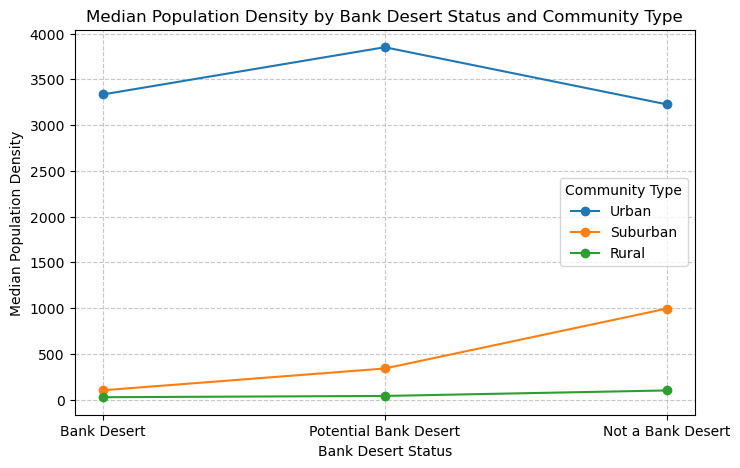

In [121]:
# Transpose the DataFrame
pop_density_vs_bsd_T = pop_density_vs_bsd.T  

# Plot
plt.figure(figsize=(8, 5))

for col in pop_density_vs_bsd_T.columns:
    plt.plot(pop_density_vs_bsd_T.index, pop_density_vs_bsd_T[col], marker='o', label=col)

# Labels and Title
plt.xlabel("Bank Desert Status")
plt.ylabel("Median Population Density")
plt.title("Median Population Density by Bank Desert Status and Community Type")
plt.legend(title="Community Type")
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

In [122]:
fig_hu = px.box(census_shapefile_gdf, 
             x = 'Bank Desert Status', 
             y = 'House Units',
             color = 'Community Type')

fig_hu.update_layout(yaxis_type='log')
fig_hu.update_traces(quartilemethod='exclusive')  # Make sure quartiles are calculated as exclusive
fig_hu.show()
fig_hu.write_html('boxplot_hu.html')

In [123]:
# the unit used to calculate the house units is median (due to outliers that were intentionally left in the data)
house_units_vs_bsd = pd.DataFrame({
    'Bank Desert': [1550, 1582, 1431], 
    'Potential Bank Desert': [1733, 1694, 1503],
    'Not a Bank Desert': [1907, 1803, 1685]
}, index = ['Urban', 'Suburban', 'Rural'])

house_units_vs_bsd

,Bank Desert,Potential Bank Desert,Not a Bank Desert
Urban,1550,1733,1907
Suburban,1582,1694,1803
Rural,1431,1503,1685


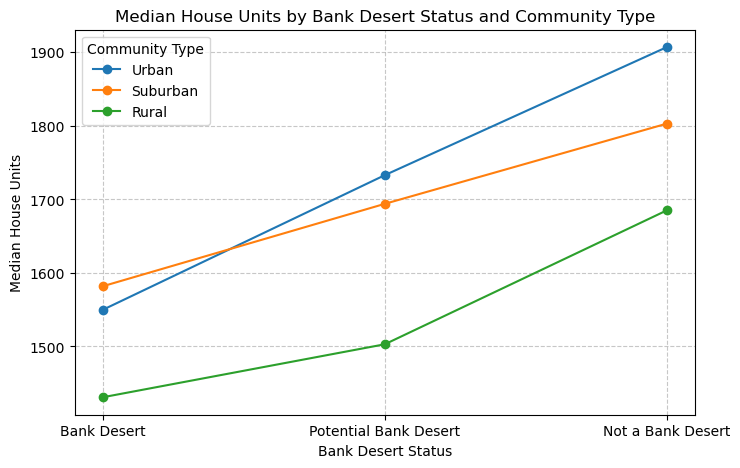

In [124]:
# Transpose the DataFrame
house_units_vs_bsd_T = house_units_vs_bsd.T  

# Plot
plt.figure(figsize=(8, 5))

for col in house_units_vs_bsd_T.columns:
    plt.plot(house_units_vs_bsd_T.index, house_units_vs_bsd_T[col], marker='o', label=col)

# Labels and Title
plt.xlabel("Bank Desert Status")
plt.ylabel("Median House Units")
plt.title("Median House Units by Bank Desert Status and Community Type")
plt.legend(title="Community Type")
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

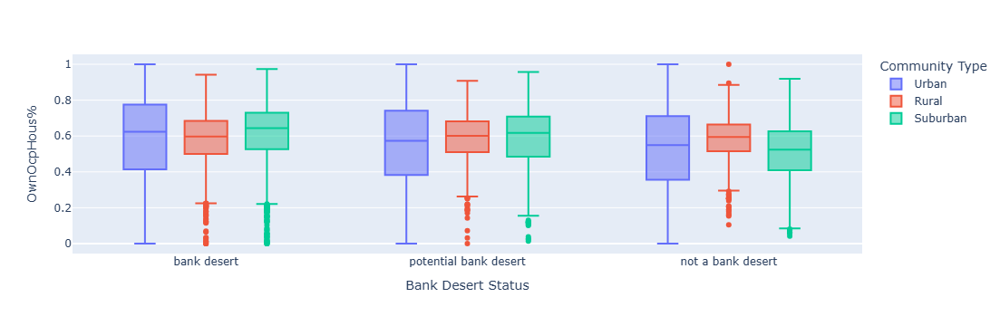

In [125]:
fig_ooh = px.box(census_shapefile_gdf, 
             x = 'Bank Desert Status', 
             y = 'OwnOcpHous%',
             color = 'Community Type')

# fig.update_layout(yaxis_type='log')
fig_ooh.update_traces(quartilemethod='exclusive')  # Make sure quartiles are calculated as exclusive
fig_ooh.show()
fig_ooh.write_html('boxplot_ooh.html')

In [126]:
# the unit used to calculate the owner occupied house percentage is median (due to outliers that were intentionally left in the data)
own_occp_house_vs_bsd = pd.DataFrame({
    'Bank Desert': [0.62, 0.64, 0.597], 
    'Potential Bank Desert': [0.57, 0.61, 0.60],
    'Not a Bank Desert': [0.54, 0.52, 0.594]
}, index = ['Urban', 'Suburban', 'Rural'])

own_occp_house_vs_bsd

,Bank Desert,Potential Bank Desert,Not a Bank Desert
Urban,0.620,0.57,0.540
Suburban,0.640,0.61,0.520
Rural,0.597,0.60,0.594


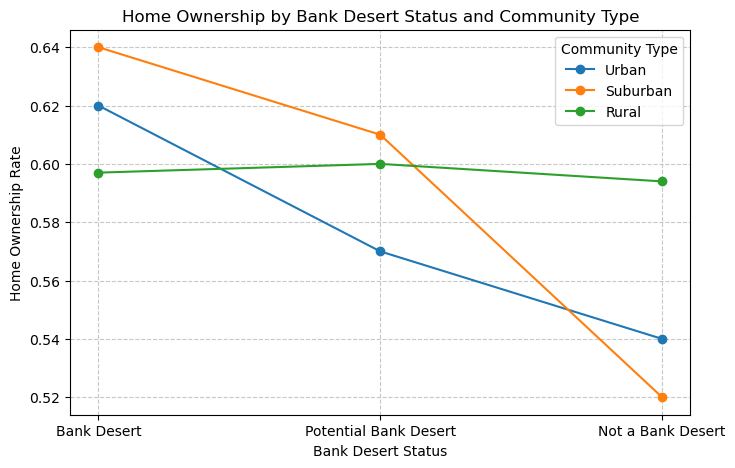

In [127]:
# Transpose the DataFrame
own_occp_house_vs_bsd_T = own_occp_house_vs_bsd.T  

# Plot
plt.figure(figsize=(8, 5))

for col in own_occp_house_vs_bsd_T.columns:
    plt.plot(own_occp_house_vs_bsd_T.index, own_occp_house_vs_bsd_T[col], marker='o', label=col)

# Labels and Title
plt.xlabel("Bank Desert Status")
plt.ylabel("Home Ownership Rate")
plt.title("Home Ownership by Bank Desert Status and Community Type")
plt.legend(title="Community Type")
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()